In [29]:
#Bibliotecas de manipulação de dados e pre processamento
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import spacy
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from unidecode import unidecode
from wordcloud import WordCloud
from PIL import Image
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from gensim.models import Word2Vec,doc2vec
from sklearn.model_selection import train_test_split,KFold,cross_validate,cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score,roc_auc_score,classification_report
from mlxtend.plotting import plot_confusion_matrix
from mlxtend.evaluate import confusion_matrix
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
stopwords_pt = stopwords.words('portuguese')
import optuna
from optuna.visualization import plot_contour
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [30]:
#Ler os arquivos

dados_treinamento = pd.read_csv('Treino.csv')
dados_teste = pd.read_csv('Teste.csv')

display(dados_teste,dados_treinamento)

,id,tweet_text,tweet_date,query_used
0,1046764676707753987,Apartamento Vila Mariana Praça Monteiro dos Sa...,Mon Oct 01 14:12:01 +0000 2018,:)
1,1047329264943751169,@FalleNCS @BrasilGameShow quero 1x1 de scout. ...,Wed Oct 03 03:35:29 +0000 2018,:)
2,1045443874947313665,mais uma analógica no correio à minha espera :...,Thu Sep 27 22:43:37 +0000 2018,:)
3,1040484298711814144,"Em festa de posse como presidente do STF, Toff...",Fri Sep 14 06:16:02 +0000 2018,folha
4,1045411876887306240,@thethiagor @jubsilva @GSCISA @GrupoMulheRIs A...,Thu Sep 27 20:36:28 +0000 2018,:)
...,...,...,...,...
4995,1049243861732794369,"Não é nada demais , apenas a verdade :) — Oh.....",Mon Oct 08 10:23:25 +0000 2018,:)
4996,1039334757690163201,Veja o que é #FATO ou #FAKE na entrevista de A...,Tue Sep 11 02:08:10 +0000 2018,#fato
4997,1049286902577356801,"@nattvieiira de quem???? queria ver, eu sai po...",Mon Oct 08 13:14:27 +0000 2018,:(
4998,1045349300744671232,ASSASSIN'S CREED ORIGINS: ENFRENTANDO OS IRMÃO...,Thu Sep 27 16:27:49 +0000 2018,:)


,id,tweet_text,tweet_date,sentiment,query_used
0,1049721159292346368,Rio elege maior bancada policial de sua histór...,Tue Oct 09 18:00:01 +0000 2018,2,folha
1,1046251157025423360,fiquei tão triste quando eu vi o preço da câme...,Sun Sep 30 04:11:28 +0000 2018,0,:(
2,1041744620206653440,"Para Theresa May, seu plano para o Brexit é a ...",Mon Sep 17 17:44:06 +0000 2018,2,exame
3,1046937084727107589,caralho eu quero proteger a danielly em um pot...,Tue Oct 02 01:37:06 +0000 2018,0,:(
4,1047326854229778432,@SiCaetano_ viva o caos :),Wed Oct 03 03:25:55 +0000 2018,1,:)
...,...,...,...,...,...
94995,1041831666883321856,Cuba e defensor de direitos humanos se unem co...,Mon Sep 17 23:30:00 +0000 2018,2,jornaloglobo
94996,1032352892194369536,#Oportunidade ➡️ Venha fazer parte da nossa eq...,Wed Aug 22 19:44:44 +0000 2018,2,#oportunidade
94997,1046785538542440448,@96syoo EU SEI 😭😭 é por isso que significa mui...,Mon Oct 01 15:34:55 +0000 2018,0,:(
94998,1045457469110177792,@louistsexhes N te conheço mas posta :D,Thu Sep 27 23:37:38 +0000 2018,1,:)



- **Base de treino (`Train3Classes.csv`)**: contém 95.000 registros com as seguintes colunas:
  - `id`: identificador único de cada tweet  
  - `content`: texto do tweet  
  - `date`: data de publicação  
  - `sentiment`: sentimento associado ao tweet (classe alvo)  
  - `query`: consulta utilizada para coletar o tweet  

- **Base de submissão/teste (`Subm3Classes.csv`)**: contém 5.000 registros com as mesmas colunas, **exceto a coluna `sentiment`**, que será prevista pelo modelo de NLP treinado na base de treino.

In [31]:
#Verificando o tipo de variável de cada dataset
dados_teste.info(),dados_treinamento.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          5000 non-null   int64 
 1   tweet_text  5000 non-null   object
 2   tweet_date  5000 non-null   object
 3   query_used  5000 non-null   object
dtypes: int64(1), object(3)
memory usage: 156.4+ KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95000 entries, 0 to 94999
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   id          95000 non-null  int64 
 1   tweet_text  95000 non-null  object
 2   tweet_date  95000 non-null  object
 3   sentiment   95000 non-null  int64 
 4   query_used  95000 non-null  object
dtypes: int64(2), object(3)
memory usage: 3.6+ MB


(None, None)

Os dois Datasets não possuem dados faltantes, agora vamos analisar se há algum dado duplicado

In [32]:
# Filtrar apenas os duplicados no dataset de treino
duplicados_treino = dados_treinamento[dados_treinamento.duplicated()]

# Filtrar apenas os duplicados no dataset de teste
duplicados_teste = dados_teste[dados_teste.duplicated()]



Vemos que também não há dados duplicados

In [33]:
# Verificando o número de IDs únicos em cada base
num_ids_treino = dados_treinamento['id'].nunique()
num_ids_teste = dados_teste['id'].nunique()

print(f"Base de treino: {len(dados_treinamento)} linhas, {num_ids_treino} IDs únicos")
print(f"Base de submissão: {len(dados_teste)} linhas, {num_ids_teste} IDs únicos")

Base de treino: 95000 linhas, 94987 IDs únicos
Base de submissão: 5000 linhas, 5000 IDs únicos


Na base de treino, existem 13 clientes que publicaram mais de um tweet, enquanto na base de submissão/teste não há repetições. Portanto, a coluna de cliente provavelmente não terá impacto relevante no modelo e poderá ser descartada posteriormente.

Antes de iniciarmos a análise exploratória, faremos uma **limpeza mínima dos dados** para facilitar a manipulação e, ao mesmo tempo, criaremos algumas colunas adicionais que poderão ser úteis na análise e modelagem.
Se quiser, posso fazer uma versão ainda mais enxuta e elegante, adequada para comentários em notebook

In [34]:
def min_clean_data(dados_treinamento, dados_teste):
    """
    Função que recebe os datasets de treino e teste, realiza uma limpeza mínima,
    renomeia colunas e cria novas colunas relacionadas à data.

    Retorna os datasets com colunas modificadas.
    """


    # Remover coluna de ID
    treino_clean = dados_treinamento.drop(columns=['id'])
    teste_clean = dados_teste.drop(columns=['id'])


    # Renomear colunas para facilitar manipulação
    treino_clean.columns = ['text','data','sentiment','query']
    teste_clean.columns = ['text','data','query']


    # Converter coluna de data para datetime
    treino_clean['date'] = pd.to_datetime(treino_clean['data'])
    teste_clean['date'] = pd.to_datetime(teste_clean['data'])

    # Criar colunas auxiliares: mês, dia e hora
    for df in [treino_clean, teste_clean]:
        df['month'] = df['date'].dt.month
        df['day'] = df['date'].dt.day
        df['hour'] = df['date'].dt.hour

    # Remover coluna original de data e manter coluna 'date' apenas com data
    treino_clean = treino_clean.drop(columns=['data'])
    teste_clean = teste_clean.drop(columns=['data'])
    treino_clean['date'] = treino_clean['date'].dt.date
    teste_clean['date'] = teste_clean['date'].dt.date

    return treino_clean, teste_clean

In [35]:
# Aplicando a limpeza mínima nos datasets de treino e teste
dados_treinamento_clean, dados_teste_clean = min_clean_data(dados_treinamento, dados_teste)

# Exibir os datasets limpos
display(dados_treinamento_clean, dados_teste_clean)

/tmp/ipython-input-1469694977.py:21: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  treino_clean['date'] = pd.to_datetime(treino_clean['data'])
/tmp/ipython-input-1469694977.py:22: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  teste_clean['date'] = pd.to_datetime(teste_clean['data'])


,text,sentiment,query,date,month,day,hour
0,Rio elege maior bancada policial de sua histór...,2,folha,2018-10-09,10,9,18
1,fiquei tão triste quando eu vi o preço da câme...,0,:(,2018-09-30,9,30,4
2,"Para Theresa May, seu plano para o Brexit é a ...",2,exame,2018-09-17,9,17,17
3,caralho eu quero proteger a danielly em um pot...,0,:(,2018-10-02,10,2,1
4,@SiCaetano_ viva o caos :),1,:),2018-10-03,10,3,3
...,...,...,...,...,...,...,...
94995,Cuba e defensor de direitos humanos se unem co...,2,jornaloglobo,2018-09-17,9,17,23
94996,#Oportunidade ➡️ Venha fazer parte da nossa eq...,2,#oportunidade,2018-08-22,8,22,19
94997,@96syoo EU SEI 😭😭 é por isso que significa mui...,0,:(,2018-10-01,10,1,15
94998,@louistsexhes N te conheço mas posta :D,1,:),2018-09-27,9,27,23


,text,query,date,month,day,hour
0,Apartamento Vila Mariana Praça Monteiro dos Sa...,:),2018-10-01,10,1,14
1,@FalleNCS @BrasilGameShow quero 1x1 de scout. ...,:),2018-10-03,10,3,3
2,mais uma analógica no correio à minha espera :...,:),2018-09-27,9,27,22
3,"Em festa de posse como presidente do STF, Toff...",folha,2018-09-14,9,14,6
4,@thethiagor @jubsilva @GSCISA @GrupoMulheRIs A...,:),2018-09-27,9,27,20
...,...,...,...,...,...,...
4995,"Não é nada demais , apenas a verdade :) — Oh.....",:),2018-10-08,10,8,10
4996,Veja o que é #FATO ou #FAKE na entrevista de A...,#fato,2018-09-11,9,11,2
4997,"@nattvieiira de quem???? queria ver, eu sai po...",:(,2018-10-08,10,8,13
4998,ASSASSIN'S CREED ORIGINS: ENFRENTANDO OS IRMÃO...,:),2018-09-27,9,27,16


<h2>Analise exploratória antes do pré processamento</h2>

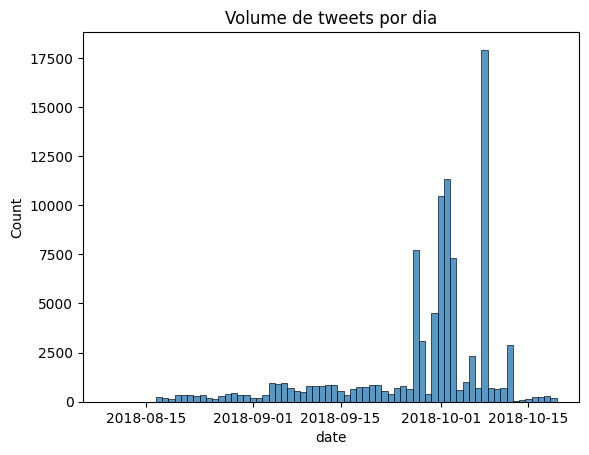

In [36]:
#Criando um histograma de volume de tweets por dia
graph = sns.histplot(data=dados_treinamento_clean['date'])
graph.set_title('Volume de tweets por dia');

Entre 20 de setembro e 10 de outubro observa-se um aumento significativo no volume de tweets.  
Posteriormente, analisaremos o conteúdo dos tweets nesse período para entender o que motivou esse pico de atividade.

Text(0.5, 0, 'Hora do dia')

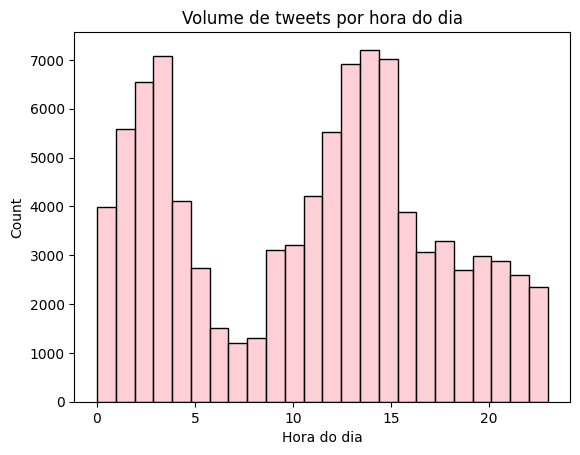

In [37]:
#Criando um histograma de volume de tweets por hora
graph = sns.histplot(data=dados_treinamento_clean['hour'],bins=24,color='pink')
graph.set_title('Volume de tweets por hora do dia')
graph.set_xlabel('Hora do dia')

O volume de tweets foi mais intenso entre 2h e 4h da madrugada e entre 11h e 15h.  
Em seguida, faremos uma análise mês a mês para compreender melhor esse padrão de comportamento.

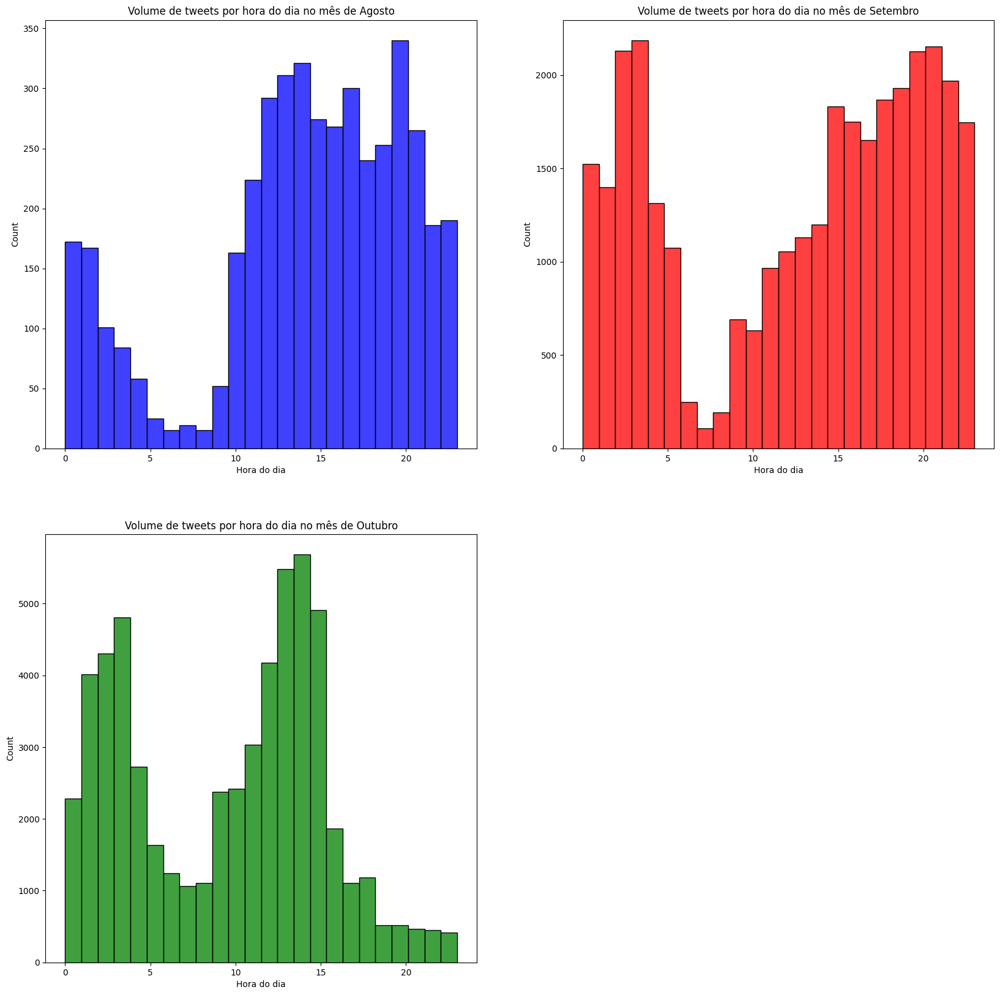

In [38]:

#Criando um grid de subplots
fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(20,20))
axes = axes.ravel()
color = ['blue','red','green']

#Criando um histograma para cada mês do ano de acordo com o número tweets por hora
for i, ax,c in zip([8,9,10],axes,color):
    filter = dados_treinamento_clean['month'] == i
    graph = sns.histplot(data=dados_treinamento_clean[filter],x='hour',bins=24,ax=ax,color=c)
    if i == 8:
        i = "Agosto"
    elif i == 9:
        i = "Setembro"
    else:
        i = "Outubro"
    graph.set_title('Volume de tweets por hora do dia no mês de '+str(i))
    graph.set_xlabel('Hora do dia')

fig.delaxes(axes[3])

Em agosto, o volume de tweets foi bastante baixo em comparação com setembro e outubro.

Em setembro, observou-se um aumento significativo no número de tweets entre 15h e 23h.  
Em outubro, o padrão de distribuição por hora foi semelhante ao observado considerando todos os meses, com picos de volume entre 2h-4h e 11h-15h.

/tmp/ipython-input-2577517340.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  graph = sns.countplot(data=dados_treinamento_clean,x='month',palette=['blue','red','green'])
/tmp/ipython-input-2577517340.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  graph.set_xticklabels(labels=['Agosto','Setembro','Outubro']);


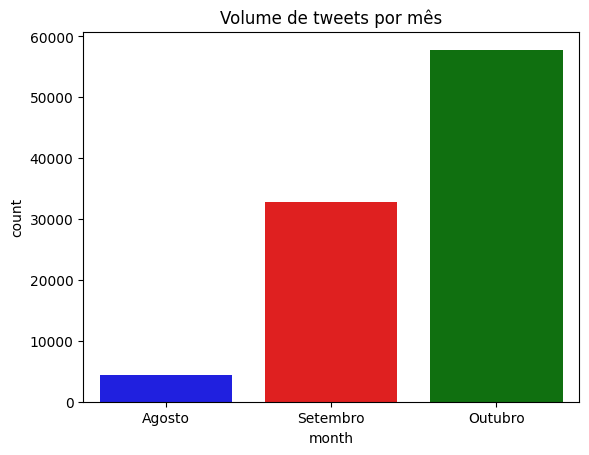

In [39]:
#Criando um countplot para cada mês do ano em relação ao volume de tweets
graph = sns.countplot(data=dados_treinamento_clean,x='month',palette=['blue','red','green'])
graph.set_title('Volume de tweets por mês')
graph.set_xticklabels(labels=['Agosto','Setembro','Outubro']);

Novamente surge a curiosidade sobre os acontecimentos em setembro e outubro, que explicam o aumento significativo no volume de tweets em comparação com agosto.


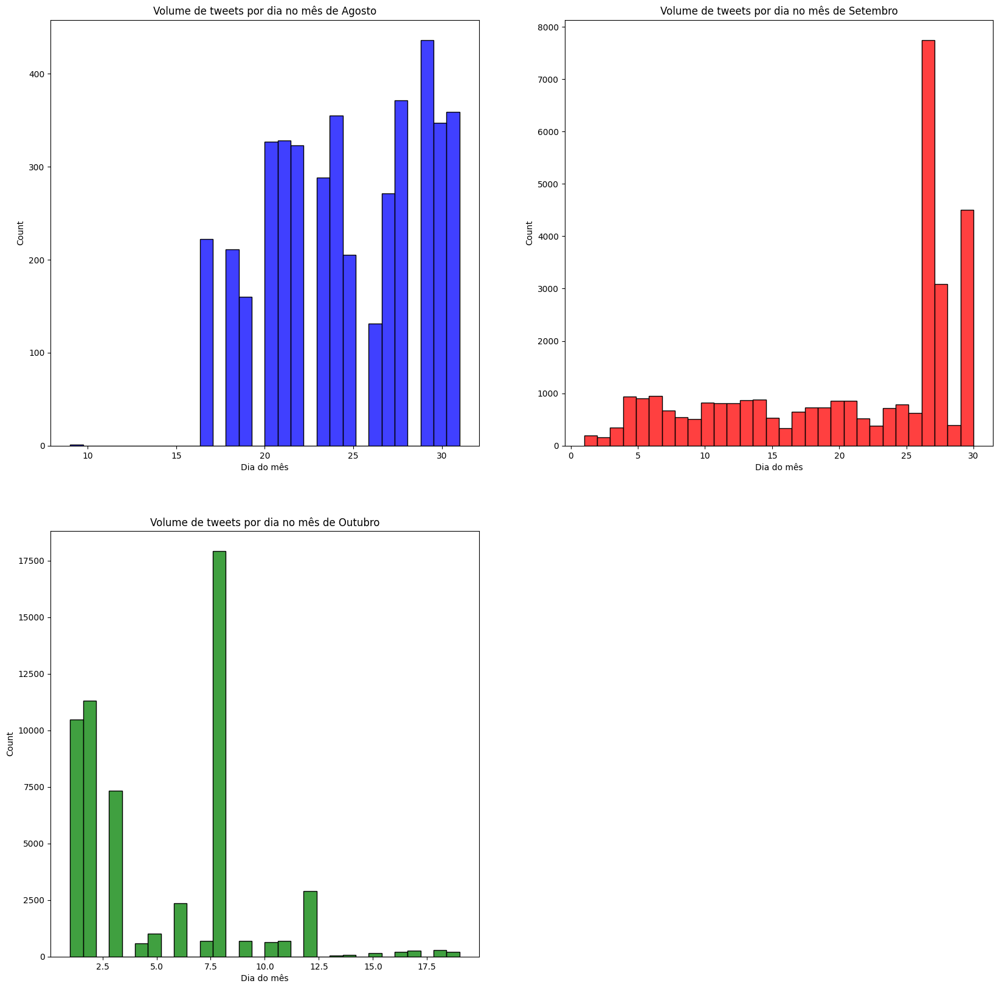

In [40]:
#Criando um grid de subplots
fig, axes = plt.subplots(nrows=2, ncols=2,figsize=(20,20))
axes = axes.ravel()
color = ['blue','red','green']

#Criando um histograma para cada mês do ano de acordo com o número de tweets por dia
for i, ax,c in zip([8,9,10],axes,color):
    filter = dados_treinamento_clean['month'] == i
    graph = sns.histplot(data=dados_treinamento_clean[filter],x='day',bins=30,ax=ax,color=c)
    if i == 8:
        i = "Agosto"
    elif i == 9:
        i = "Setembro"
    else:
        i = "Outubro"
    graph.set_title('Volume de tweets por dia no mês de '+str(i))
    graph.set_xlabel('Dia do mês')

fig.delaxes(axes[3])

Nos dias 27 de setembro e 1, 2 e 8 de outubro, houve picos consideráveis no volume de tweets, possivelmente decorrentes de diferentes eventos sendo intensamente comentados na rede social.

A seguir, analisaremos as queries utilizadas para coletar essas publicações.


In [41]:
#Verificando o volume de tweets por query
dados_treinamento_clean['query'].value_counts()

,count
query,
:(,31696
:),31678
folha,5004
estadao,3880
#fato,3471
g1,3439
exame,3417
#trabalho,3030
#oportunidade,2455


Não são muitas querys diferentes e a maior parte está concentrada em emojis. É possível perceber que são querys bem generalistas, vinculadas a grandes empresas de comunicação

/tmp/ipython-input-1372358838.py:4: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  graph.set_xticklabels(labels=['Negativo','Positivo','Neutro']);


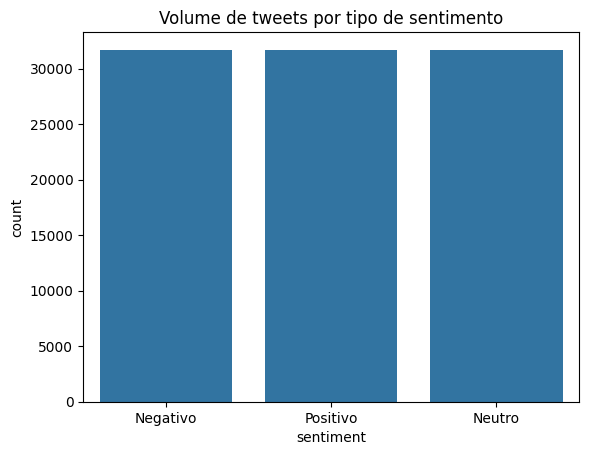

In [42]:
#Criando um counplot de acordo com o sentimento
graph = sns.countplot(data=dados_treinamento_clean,x='sentiment')
graph.set_title('Volume de tweets por tipo de sentimento')
graph.set_xticklabels(labels=['Negativo','Positivo','Neutro']);

O dataset está com a variável target bastante balanceada, o que é excelente



In [43]:
# Criando uma tabela cruzada
tabela_sentimento_query = pd.crosstab(
    index=dados_treinamento_clean['query'],
    columns=dados_treinamento_clean['sentiment'],
    values=dados_treinamento_clean['hour'],
    aggfunc='count'
)

# Exibir a tabela
tabela_sentimento_query

sentiment,0,1,2
query,,,
#curiosidade,NaN,NaN,381.0
#fato,NaN,NaN,3471.0
#noticia,NaN,NaN,1114.0
#novidade,NaN,NaN,920.0
#oportunidade,NaN,NaN,2455.0
#trabalho,NaN,NaN,3030.0
:(,31696.0,NaN,NaN
:),NaN,31678.0,NaN
estadao,NaN,NaN,3880.0


Os dados apresentam consistência:  
- Queries relacionadas a emojis de sentimento negativo estão majoritariamente associadas a tweets com sentimento negativo.  
- Queries relacionadas a emojis de sentimento positivo estão majoritariamente associadas a tweets com sentimento positivo.  
- Queries relacionadas a veículos de comunicação estão associadas, em sua maioria, a tweets com sentimento neutro.

<h4>Pre processamento e continuação da análise exploratória</h4>

In [44]:
nlp = spacy.load('pt_core_news_lg')
stopwords_pt = stopwords.words('portuguese')

def pre_process(row,nlp=nlp,stopwords=stopwords_pt):
    '''Função recebe cada linha do dataset, realiza o pre processamento e retorna uma lista de tokens'''

    #Removendo menções
    row = re.sub(r'@[a-zA-Z0-9_]{1,50}','',row)
    #Removendo o links:
    row = re.sub(r'(https:\/\/.+)','',row)
    #Colocando todas as palavras em minúsculo
    row = row.lower()
    #Removendo todos os :d (sorriso) ou sorriso:p
    row = row.replace(':d','')
    row = row.replace(':p','')
    #Removendo os digitos
    row = re.sub(r'\d+','',row)
    #Removendo a acentuação
    row = unidecode(row)
    #Removendo os caracteres especiais
    row = re.sub(r'[^a-zA-Z0-9]',' ',row)
    #Removendo caracteres repetidos 3 ou mais vezes
    row = re.sub(r'(\w)\1(\1+)',r'\1',row)
    #Removendo os espaços do inicio e final de cada frase
    row = row.strip()
    #Tokenizando
    doc = nlp(row)
    #Removendo as stopwords:
    row = [word for word in doc if word.text not in stopwords_pt]
    #Removendo palavras que não tem lemma
    row = [word.lemma_.strip() for word in row]
    #Removendo elementos vazio
    row = [word for word in row if word != '']
    return row

In [45]:
#Criando as variáveis do dataset limpo
words_train_clean = dados_treinamento_clean.copy() #Treino
words_sub_clean = dados_teste_clean.copy() #Teste

#Aplicando a função de pre-processamento linha a linha ->output igual uma lista de tokens para cada linha
words_train_clean['text_clean'] = words_train_clean['text'].apply(lambda x: pre_process(x))
#Juntando essa lista de tokens em uma única string
words_train_clean['text_joined'] = words_train_clean['text_clean'].apply(lambda x: ' '.join(x))

#Aplicando a função de pre-processamento linha a linha ->output igual uma lista de tokens para cada linha
words_sub_clean['text_clean'] = words_sub_clean['text'].apply(lambda x: pre_process(x))
#Juntando essa lista de tokens em uma única string
words_sub_clean['text_joined'] = words_sub_clean['text_clean'].apply(lambda x: ' '.join(x))

In [46]:
words_train_clean.head()

,text,sentiment,query,date,month,day,hour,text_clean,text_joined
0,Rio elege maior bancada policial de sua histór...,2,folha,2018-10-09,10,9,18,"[rio, eleger, grande, bancada, policial, histo...",rio eleger grande bancada policial historia
1,fiquei tão triste quando eu vi o preço da câme...,0,:(,2018-09-30,9,30,4,"[fiquei, tao, triste, ver, preco, camera]",fiquei tao triste ver preco camera
2,"Para Theresa May, seu plano para o Brexit é a ...",2,exame,2018-09-17,9,17,17,"[theresa, may, plano, brexit, unico, opcao]",theresa may plano brexit unico opcao
3,caralho eu quero proteger a danielly em um pot...,0,:(,2018-10-02,10,2,1,"[caralho, querer, proteger, danielly, pote, ta...",caralho querer proteger danielly pote tadinhaa
4,@SiCaetano_ viva o caos :),1,:),2018-10-03,10,3,3,"[viva, caos]",viva caos


In [47]:
# Criando uma função para gerar nossos datasets de wordcloud
def wc_df(df, filter=False,filter_type=None,column='text_clean'):
    '''Função que cria um dicionário com a quantidade de ocorrências de cada palavra no dataset'''

    #Se houver filtro usa ele
    if filter:
        #Criando um dataframe com as palavras únicas
        vocabulary = pd.DataFrame(
                                np.concatenate(df.loc[filter_type,column].values),
                                columns=['word']
                                )
    else:
        #Criando um dataframe com as palavras únicas
        vocabulary = pd.DataFrame(
                                np.concatenate(df[column].values),
                                columns=['word']
                                )
    #Criando um dicionário com as palavras únicas
    dict_wc = vocabulary.groupby('word').size().to_dict()
    return dict_wc

#Função de plot da word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud)
    # No axis details
    plt.axis("off")

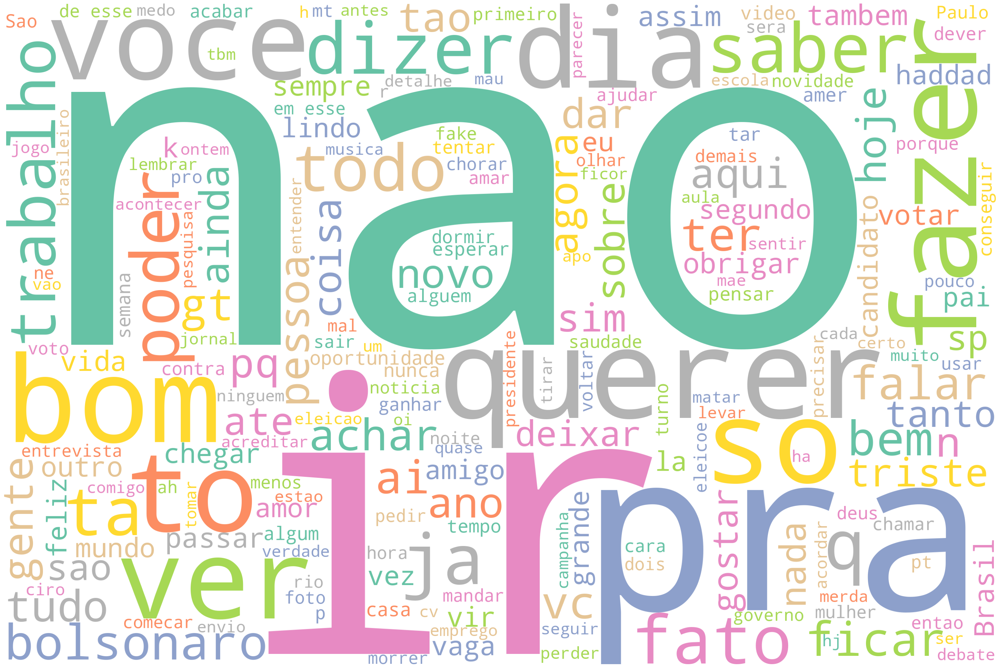

In [48]:
#Criando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='white',
                            colormap='Set2',
                            collocations=False,
                            stopwords=stopwords_pt,
                        ).generate_from_frequencies(wc_df(words_train_clean))
         )
plot_cloud(wordcloud)

Algumas impressões iniciais a partir da wordcloud:

- **Abreviações e expressões informais** aparecem com frequência: `"q"`, `"n"`, `"pq"` e algumas letras aleatórias como `"k"`, `"r"`, `"gt"`.  
- **Nomes de políticos** são recorrentes: `"Ciro"`, `"Bolsonaro"`, `"Haddad"`, juntamente com palavras relacionadas a política: `"presidente"`, `"candidatar"`, `"governar"`, `"votar"`, `"eleições"`, `"candidato"`, `"campanha"`, `"turno"`, `"debater"`.  
- **Contrações ou abreviações que deveriam estar nas stopwords** passaram despercebidas e talvez precisem ser removidas:  
  `"pra"` (para), `"to"` (estou), `"tao"` / `"estao"` (estão), `"mt"` (muito), `"eh"` (é), `"o"`, `"tbm"` (também), `"pro"` (para o), `"vc"` (você), `"ta"` (está), `"tava"` (estava), `"nao"` (não).  
- **Verbros comuns** que aparecem bastante: `"ir"`, `"querer"`, `"trabalhar"`, `"dizer"`, `"saber"`.


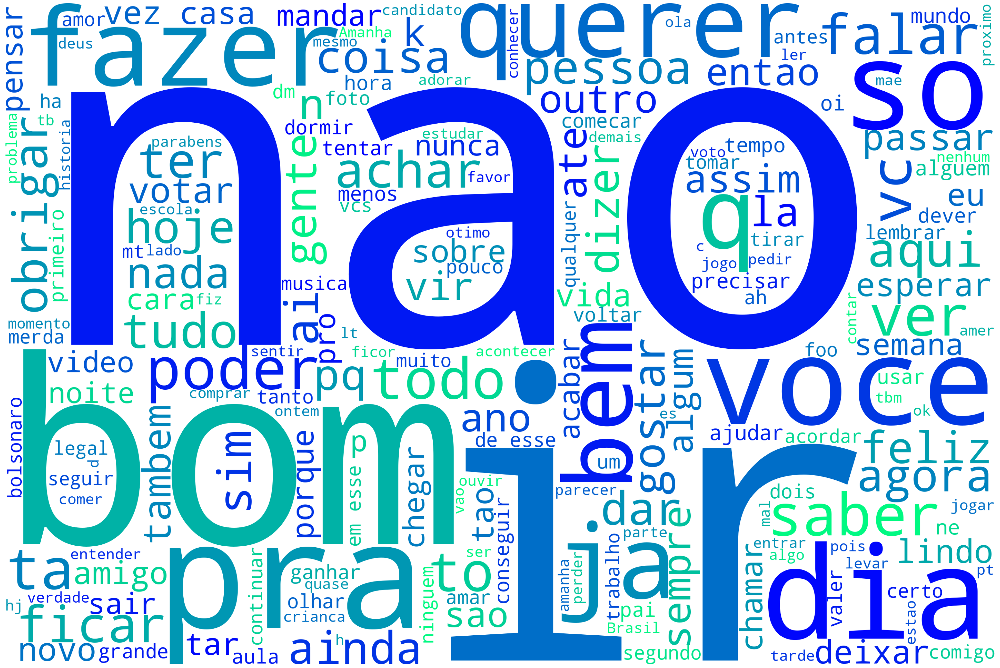

In [49]:
# Criando uma função para gerar nossos datasets de wordcloud
#Gerando um filtro para pegar opiniões positivas
filter = (words_train_clean['sentiment'] == 1)
#Gerando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='white',
                            colormap='winter',
                            collocations=False,
                            stopwords=stopwords_pt,
                        ).generate_from_frequencies(wc_df(words_train_clean,filter=True,filter_type=filter))
         )
plot_cloud(wordcloud)

É possível observar que várias palavras frequentes remetem a **sentimentos positivos**, como:  
"bom", "feliz", "gostar", "poder", "melhor", "amigo", "dia", "casar", "lindo", "verdade", "amar", "adorar", "bem".

No entanto, algumas palavras frequentes podem transmitir uma **conotação negativa**, quando lidas fora de contexto, por exemplo:  
"falir", "problema", "merda", "caro", "obr


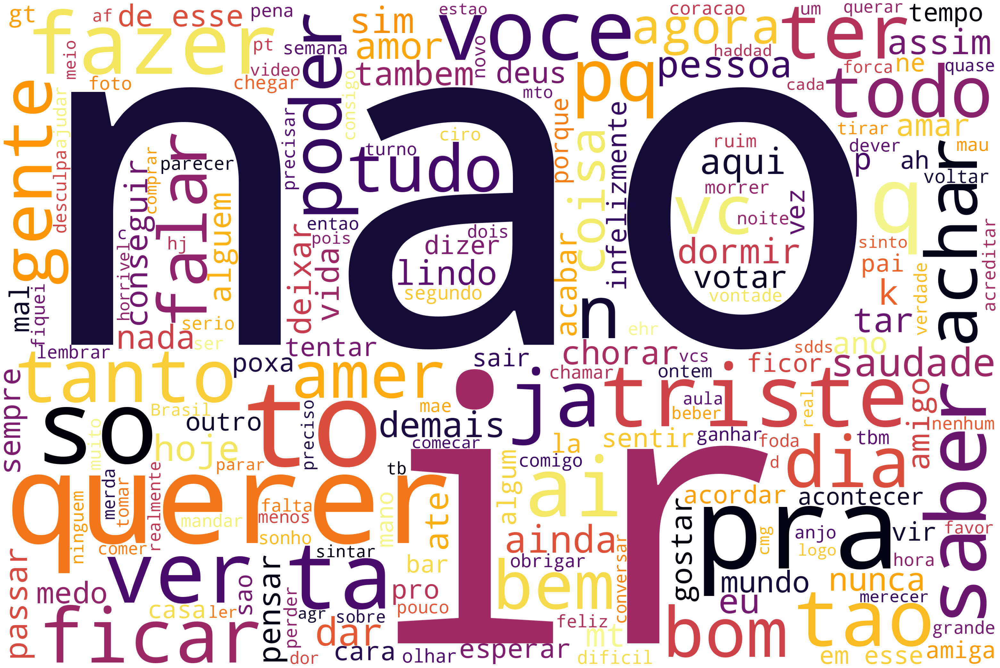

In [50]:
# Criando uma função para gerar nossos datasets de wordcloud
#Gerando um filtro para pegar opiniões negativas
filter = (words_train_clean['sentiment'] == 0)
#Gerando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='white',
                            colormap='inferno',
                            collocations=False,
                            stopwords=stopwords_pt,

                        ).generate_from_frequencies(wc_df(words_train_clean,filter=True,filter_type=filter))
         )
plot_cloud(wordcloud)

Algumas palavras com forte conotação de **sentimento negativo** se destacam:  
"triste", "mal", "chorar", "saudade", "infelizmente", "caro", "morrer".

Nessa categoria, os políticos **"Haddad"** e **"Ciro"** aparecem com mais frequência, o que pode indicar que esta amostra de tweets apresenta um **viés de posicionamento político mais favorável à direita**.

Em seguida, vamos repetir o mesmo processo de análise para os tweets classificados como **neutros**.


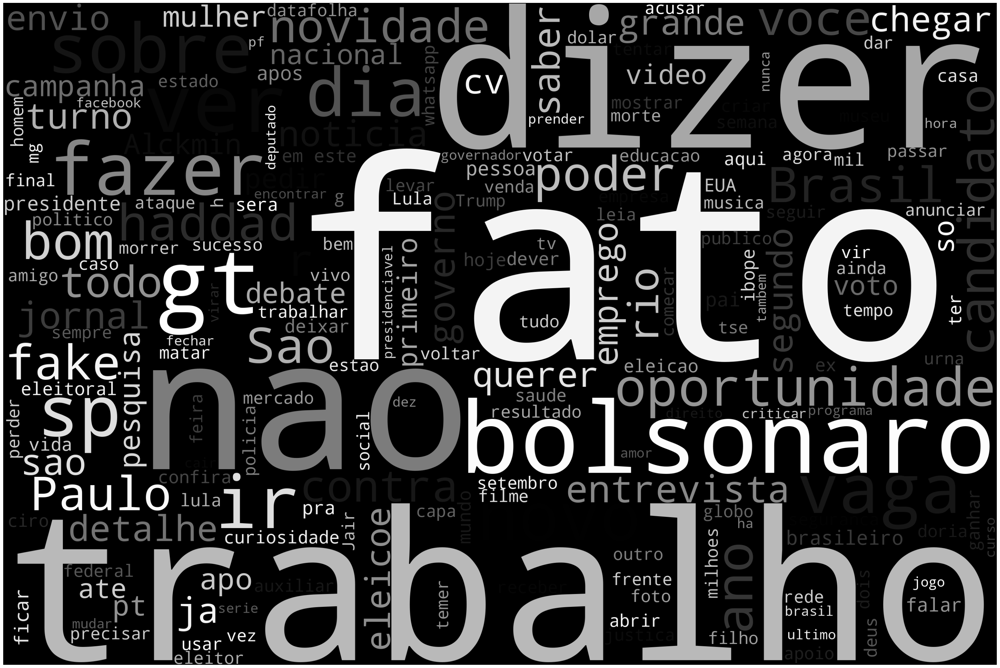

In [51]:
#Gerando um filtro para pegar opiniões neutras
filter = (words_train_clean['sentiment'] == 2)
#Gerando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='black',
                            colormap='Greys',
                            collocations=False,
                            stopwords=stopwords_pt
                        ).generate_from_frequencies(wc_df(words_train_clean,filter=True,filter_type=filter))
         )
plot_cloud(wordcloud)

As palavras mais expressivas mudam consideravelmente nos tweets neutros. Observamos que os políticos **Bolsonaro, Haddad e Ciro** são bastante citados, contrariando a hipótese inicial de que a amostra teria um viés favorável à direita. Além disso, **Lula** e **Geraldo Alckmin** aparecem com frequência nos tweets neutros.

O tema **política** é bastante presente, evidenciado por palavras como:  
"candidatar", "campanha", "eleições", "senado", "trump", "deputar", "governar", "candidato", "votar", "pesquisa", "urna", "ibope".

Também aparecem palavras relacionadas à **conquista de emprego**, como: "trabalhar", "empregar", "entrevista", "oportunidade".

### Análise por datas e horários

Entre os dias **27 de setembro** e **1, 2 e 8 de outubro**, houve um volume muito maior de tweets. Inicialmente, levantou-se a hipótese de que algum evento específico poderia ter ocorrido.  
Observando as word clouds e considerando que esse período foi próximo ao **primeiro turno das eleições de 2018**, temos uma possível explicação para o aumento do volume: o crescimento próximo à data de votação e o pico no dia 8 (dia da eleição).

Considerando que, no primeiro turno, o político **Bolsonaro** teve um elevado volume de votos e seu discurso enfatizava a **geração de empregos**, faz sentido que ele tenha sido amplamente comentado. Da mesma forma, é coerente a presença expressiva de palavras relacionadas a **trabalho** nos tweets.


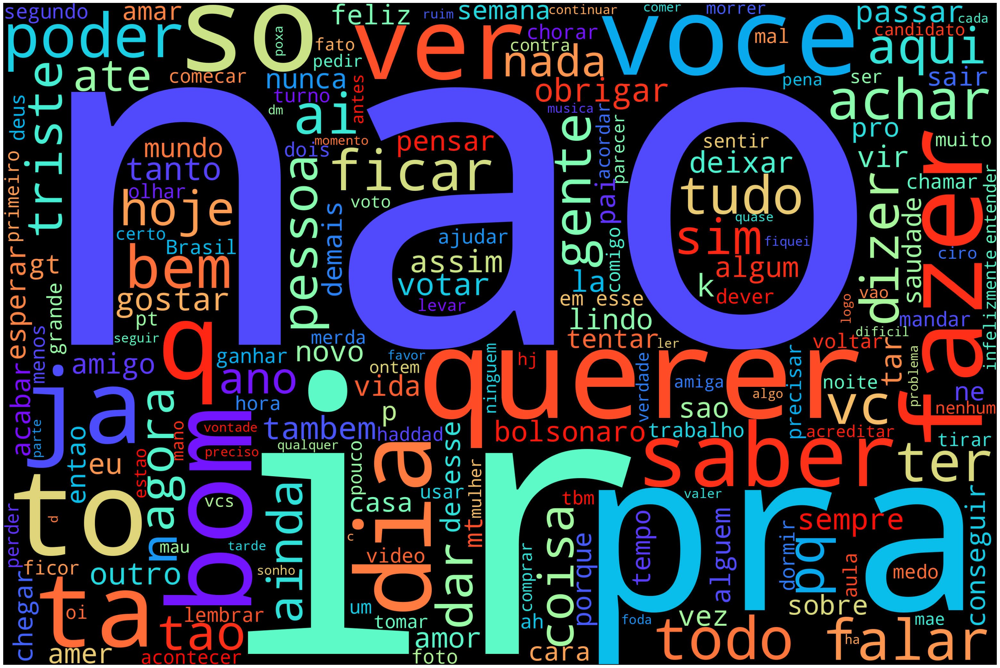

In [52]:
#Gerando um filtro para pegar nos meses de setembro e outubro entre as janelas de horário de maior intensidade (2h - 4h e 11h - 23h)
filter = ((words_train_clean['month'].isin([10,9])) &
        (words_train_clean['hour'].isin([2,3,4,11,12,13,14,15,16,17,18,19,20,21,22,23]))
        & (words_train_clean['day'].isin([1,2,3,8,27])))
#Gerando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='black',
                            colormap='rainbow',
                            collocations=False,
                            stopwords=stopwords_pt
                        ).generate_from_frequencies(wc_df(words_train_clean,filter=True,filter_type=filter))
         )
plot_cloud(wordcloud)

Observa-se que as palavras na wordcloud não estão muito variadas.  
- Há diversas palavras com **sentimento positivo**: "gostar", "casar", "amigo", "ajudar", "bom", "amar", "feliz", "parabéns".  
- Também aparecem palavras com **sentimento negativo**: "morrer", "merda", "foder", "caro", "falir", "triste", "obrigar", "mal", "medo".  
- Além disso, várias palavras possuem **cunho neutro**.

Portanto, essa wordcloud não trouxe conclusões claras sobre os sentimentos.

### Passo 3: Modelagem e conclusões

Iniciaremos o processo de modelagem. Como baseline, utilizaremos a **transformação Bag of Words**.  
Testaremos uma série de modelos e analisaremos as principais métricas de desempenho: **acurácia, recall, precision e AUC**.


In [53]:
#Colocar o train_test_splot
def baseline_transform(models,X=words_train_clean['text_joined'],y=words_train_clean['sentiment'],verbose=False):
    '''
    Funçã recebe uma lista de modelos, aplica uma transformação de bag of words no dataset e faz uma validação cruzada de 5 folds com cada modelo
    Além disso ela calcula diversas métricas de avaliação para cada modelo e retorna um dataframe com essas métricas
    Verbose foi usado para imprimir para dar alguma ideia ao usuário do progresso
    '''
    #Dicionário de métricas de avaliação para cada modelo
    models_dict = {}
    #Lista de métricas de avaliação que usaremos
    metrics = ['recall_weighted','precision_weighted','f1_weighted','accuracy','roc_auc_ovr']


    if verbose:
        print("Iniciando o loop de modelos")
    #Loop para cada modelo
    for model in models:
        if verbose:
            print(f"Fit do modelo {model} iniciado")
        #Criando o pipeline
        pipe = Pipeline(steps=[('vect',CountVectorizer()),
                                (model,models[model])])
        #Fazendo a validação cruzada
        scores = cross_validate(pipe,X,y,cv=5,scoring=metrics,return_train_score=True,n_jobs=-1)

        # Dicionário com as métricas de cada modelo
        models_dict[model] = {'recall_test': scores['test_recall_weighted'].mean(),
                                     'recall_train': scores['train_recall_weighted'].mean(),
                                     'precision_test': scores['test_precision_weighted'].mean(),
                                     'precision_train': scores['train_precision_weighted'].mean(),
                                     'f1_test': scores['test_f1_weighted'].mean(),
                                     'f1_train': scores['train_f1_weighted'].mean(),
                                     'accuracy_test': scores['test_accuracy'].mean(),
                                     'accuracy_train': scores['train_accuracy'].mean(),
                                     'roc_auc_test': scores['test_roc_auc_ovr'].mean(),
                                     'roc_auc_train': scores['train_roc_auc_ovr'].mean(),
                                    }
        if verbose:
            print(f"Fit do modelo {model} finalizado")
    tabela = pd.DataFrame(models_dict)
    return tabela

In [54]:
#Dicionário de modelos
models = {
    'Random Forest': RandomForestClassifier(random_state=43, n_jobs=-1, n_estimators=50),
    'Gradiente Boost': GradientBoostingClassifier(random_state=43, n_estimators=50),
    'Regressão Logística': LogisticRegression(random_state=43, max_iter=500),
    'XGBoost': XGBClassifier(random_state=43, eval_metric='logloss', use_label_encoder=False, n_jobs=-1, n_estimators=50),
    'Catboost': CatBoostClassifier(random_state=43, verbose=False, iterations=50, thread_count=-1)
}

baseline_table = baseline_transform(models,verbose=True)


Iniciando o loop de modelos
Fit do modelo Random Forest iniciado
Fit do modelo Random Forest finalizado
Fit do modelo Gradiente Boost iniciado
Fit do modelo Gradiente Boost finalizado
Fit do modelo Regressão Logística iniciado
Fit do modelo Regressão Logística finalizado
Fit do modelo XGBoost iniciado
Fit do modelo XGBoost finalizado
Fit do modelo Catboost iniciado
Fit do modelo Catboost finalizado


In [55]:
baseline_table

,Random Forest,Gradiente Boost,Regressão Logística,XGBoost,Catboost
recall_test,0.756179,0.630126,0.796147,0.713800,0.718684
recall_train,0.989187,0.632268,0.895205,0.730218,0.724308
precision_test,0.761665,0.690913,0.796897,0.735458,0.735092
precision_train,0.989216,0.693219,0.895118,0.752197,0.740389
f1_test,0.757457,0.637232,0.796304,0.717787,0.721657
f1_train,0.989196,0.639362,0.895115,0.734056,0.727118
accuracy_test,0.756179,0.630126,0.796147,0.713800,0.718684
accuracy_train,0.989187,0.632268,0.895205,0.730218,0.724308
roc_auc_test,0.901157,0.826299,0.923989,0.878854,0.880954
roc_auc_train,0.998656,0.829132,0.973511,0.892100,0.884575


Como nosso objetivo é **classificar corretamente os tweets**, focaremos na métrica de **precision**.  
O motivo é que provavelmente serão analisadas **amostras de tweets**, e nosso objetivo é acertar o maior número de sentimentos corretos dentro dessas amostras, e não apenas maximizar o número total de tweets classificados corretamente (recall).

É importante destacar que os modelos **Random Forest** e **Regressão Logística** apresentaram **overfitting** no conjunto de treino.

Considerando que o modelo de **Regressão Logística** apresentou o melhor desempenho em precision, utilizaremos ele como **baseline** para testar diferentes transformações de dados.  
As técnicas que serão avaliadas são:

- Bag of Words  
- TF-IDF  
- Word2Vec  
- Doc2Vec


<h3>Testando transformações</h3>

In [56]:
def train_test_word2vec(x,model):
    '''Função para criar as amostras de teste e treino do word2vec
    Recebe o dataset e o modelo word2vec'''
    X_w2v_sn = [] #lista para somar os vetores
    for phrase in x:
        vecs = []
        for word in phrase:
            if word in model.wv.index_to_key:
                vecs.append(model.wv.get_vector(word))
        if vecs:
            soma_normalizada = np.sum(vecs, axis=0) / np.linalg.norm(np.sum(vecs, axis=0))
            X_w2v_sn.append(soma_normalizada)
        else:
            X_w2v_sn.append(np.zeros(model.vector_size))
    return np.array(X_w2v_sn)

def read_corpus_doc2vec(list_sentences, tokens_only=False):
  '''Função para criar os identificadores únicos para os documentos'''
  if tokens_only:
    return list_sentences
  else:
    lista = []
    for i, line in enumerate(list_sentences):
      lista.append(doc2vec.TaggedDocument(line, [i]))
    return lista

def train_test_doc2vec(x,model):
  '''Função para criar as amostras de teste e treino do doc2vec'''
  X_d2v = []
  for phrase in x:
    X_d2v.append(model.infer_vector(phrase))
  return np.array(X_d2v)

#Criando o X e o Y que usaremos nas transformações de bag of words e TF-IDF
X = words_train_clean['text_joined'].copy()
y = words_train_clean['sentiment'].copy()
#Treino para o bag of words e para o TF-IDF (passamos de treino e teste uma sentença)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

#Criando o X e o Y que usaremos nas transformações de word2vec e doc2vec
X_ = words_train_clean['text_clean'].copy()
y_ = words_train_clean['sentiment'].copy()
#Treino para doc2vec
X_train_, X_test_, y_train_, y_test_ = train_test_split(X_, y_, test_size = 0.3, random_state = 42)


#Fazendo as transformações em cada dataset de treino e teste cada transformação

#####Bag of words#####
cv = CountVectorizer()
X_train_cv = cv.fit_transform(X_train)
X_test_cv = cv.transform(X_test)
print("Bag of words criado")

######TF-IDF#####
tfidf = TfidfVectorizer()
X_train_tfidf = tfidf.fit_transform(X_train)
X_test_tfid = tfidf.transform(X_test)
print('TF-IDF criado')

######Word2Vec skipgram#####
w2v_s = Word2Vec(sentences=X_train_, vector_size=500, min_count=5, workers=-1,sg=1)
X_train_w2v_sn_skip = train_test_word2vec(X_train_,model=w2v_s)
X_test_w2v_sn_skip = train_test_word2vec(X_test_,model=w2v_s)
print('Word2Vec skipgram criado')


#####Word2Vec cbow#####
w2v_c = Word2Vec(sentences=X_train_, vector_size=500, min_count=5, workers=-1,sg=0)
X_train_w2v_sn_cbow = train_test_word2vec(X_train_,model=w2v_c)
X_test_w2v_sn_cbow = train_test_word2vec(X_test_,model=w2v_c)
print('Word2Vec cbow criado')

#####Doc2vec#####
train_corpus = read_corpus_doc2vec(X_train_)
test_corpus = read_corpus_doc2vec(X_test_, tokens_only=True)
d2v = doc2vec.Doc2Vec(vector_size=500, min_count=2, epochs=20)
d2v.build_vocab(train_corpus)
d2v.train(train_corpus, total_examples=d2v.corpus_count, epochs=d2v.epochs)
X_train_d2v = train_test_doc2vec(X_train_,model=d2v)
X_test_d2v = train_test_doc2vec(X_test_,model=d2v)
print('Doc2vec criado')

Bag of words criado
TF-IDF criado


Word2Vec skipgram criado


Word2Vec cbow criado
Doc2vec criado


In [57]:
def try_transformers(transformers_dict,model):
    '''
    Função para testar todas as transformações no dataset usando a regressão logística como modelo padrão.
    A função recebe um dicionário de datasets de treino e teste associados a cada transformação e retorna uma tabela de métricas de avaliação de cada transformação
    '''
    #Dicionário de métricas para cada transformador
    transformers_metrics = {}
    #Lista de métricas a serem avaliadas
    metrics = ['recall_weighted','precision_weighted','f1_weighted','accuracy','roc_auc_ovr']

    #Loop para testar todas as transformações
    for transformer,train_test_sets in transformers_dict.items():
        print(transformer.upper())
        print(f'Treinando {transformer}')

        #Fazendo a validação cruzada (usando somente a base de treino)
        scores = cross_validate(model,train_test_sets['X_train'],train_test_sets['y_train'],cv=5,scoring=metrics,n_jobs=-1) #aqui está ocorrendo target leadk da base de validação para a base de treino e precisará ser corrigido em uma revisão do projeto
        print(f'Treinamento com {transformer} finalizado')


        print(f'Testando {transformer}')
        #Fitando o modelo agora com toda a base de treino
        model.fit(train_test_sets['X_train'], train_test_sets['y_train'])
        #Predizendo com a base de teste
        y_pred_test = model.predict(train_test_sets['X_test'])
        #Predizendo a probabilidade de cada label
        y_pred_test_prob = model.predict_proba(train_test_sets['X_test'])

        #Calculando as métricas de avaliação do teste
        accuracy_test = accuracy_score(train_test_sets['y_test'], y_pred_test)
        precision_test = precision_score(train_test_sets['y_test'], y_pred_test, average='weighted')
        recall_test = recall_score(train_test_sets['y_test'], y_pred_test, average='weighted')
        f1_test = f1_score(train_test_sets['y_test'], y_pred_test, average='weighted')
        auc_test = roc_auc_score(train_test_sets['y_test'], y_pred_test_prob,multi_class='ovr')

        # Dicionário com as métricas de cada modelo
        transformers_metrics[transformer] = {'recall_test': recall_test,
                                     'recall_train': scores['test_recall_weighted'].mean(),
                                     'precision_test': precision_test,
                                     'precision_train': scores['test_precision_weighted'].mean(),
                                     'f1_test': f1_test,
                                     'f1_train': scores['test_f1_weighted'].mean(),
                                     'accuracy_test': accuracy_test,
                                     'accuracy_train': scores['test_accuracy'].mean(),
                                     'roc_auc_test': auc_test,
                                     'roc_auc_train': scores['test_roc_auc_ovr'].mean(),
                                    }
        print(f'Teste com {transformer} finalizado')

        print('''
                 ###############################################
                 ################ Classification Report ###############
                 ###############################################
               ''' )
        print(classification_report(train_test_sets['y_test'],y_pred_test))

        print(50*"*",'\n')

    table = pd.DataFrame(transformers_metrics)
    return table

#Dicionário de transformadores com suas respectivas bases de treino e testes com as transformações aplicadas
transformers_train_test_sets = {'bag of words':{'X_train':X_train_cv,
                                                'X_test':X_test_cv,
                                                'y_train':y_train,
                                                'y_test':y_test},

                                        'TF-IDF':{'X_train':X_train_tfidf,
                                                'X_test':X_test_tfid,
                                                'y_train':y_train,
                                                'y_test':y_test},

                            'Word2Vec skipgram':{'X_train':X_train_w2v_sn_skip,
                                                'X_test':X_test_w2v_sn_skip,
                                                'y_train':y_train_,
                                                'y_test':y_test_},

                                'Word2Vec cbow':{'X_train':X_train_w2v_sn_cbow,
                                                'X_test':X_test_w2v_sn_cbow,
                                                'y_train':y_train_,
                                                'y_test':y_test_},

                                    'Doc2vec':{'X_train':X_train_d2v,
                                                'X_test':X_test_d2v,
                                                'y_train':y_train_,'y_test':y_test_}}

In [58]:
#Criando o modelo
model = LogisticRegression(max_iter=1000, n_jobs=-1, random_state=42)

#Chamando a Função
table = try_transformers(transformers_train_test_sets, models)


BAG OF WORDS
Treinando bag of words
Treinamento com bag of words finalizado
Testando bag of words
Teste com bag of words finalizado

                 ###############################################
                 ################ Classification Report ###############
                 ###############################################
               
              precision    recall  f1-score   support

           0       0.72      0.75      0.74      9559
           1       0.71      0.69      0.70      9555
           2       0.95      0.93      0.94      9386

    accuracy                           0.79     28500
   macro avg       0.79      0.79      0.79     28500
weighted avg       0.79      0.79      0.79     28500

************************************************** 

TF-IDF
Treinando TF-IDF
Treinamento com TF-IDF finalizado
Testando TF-IDF
Teste com TF-IDF finalizado

                 ###############################################
                 ################ Classificatio

Observamos que, em todos os modelos, os **tweets com sentimento neutro (2)** apresentam a melhor **precision**.  
Pela wordcloud, também é perceptível que, nesse grupo, há um **volume maior de palavras relacionadas a eleições**, ou seja, termos mais nichados, o que possivelmente beneficia o modelo.

Para entender melhor esse comportamento, vamos visualizar **as datas com maior concentração de cada tipo de sentimento**.


In [59]:
table

,bag of words,TF-IDF,Word2Vec skipgram,Word2Vec cbow,Doc2vec
recall_test,0.790667,0.794526,0.677754,0.677754,0.626491
recall_train,0.791489,0.797669,0.678872,0.678872,0.616241
precision_test,0.791801,0.793773,0.675867,0.675867,0.624770
precision_train,0.792549,0.796856,0.677267,0.677267,0.614548
f1_test,0.791094,0.793915,0.676601,0.676601,0.625405
f1_train,0.791789,0.797007,0.677908,0.677908,0.615073
accuracy_test,0.790667,0.794526,0.677754,0.677754,0.626491
accuracy_train,0.791489,0.797669,0.678872,0.678872,0.616241
roc_auc_test,0.920577,0.924499,0.851038,0.851038,0.805670
roc_auc_train,0.921488,0.925779,0.851737,0.851737,0.796677


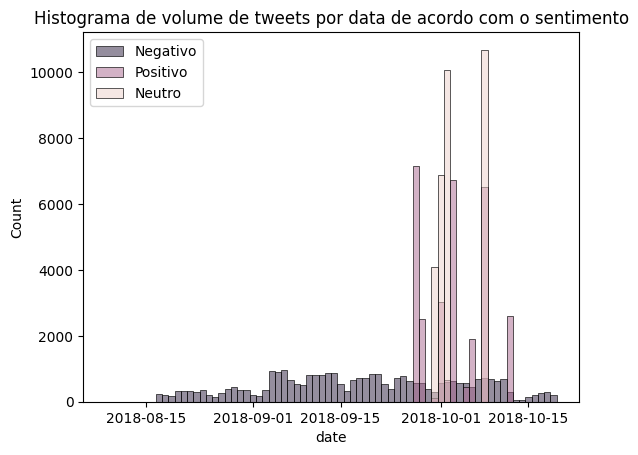

In [60]:
#Criando um histograma
graph = sns.histplot(data=words_train_clean,x='date',hue='sentiment')
graph.set_title('Histograma de volume de tweets por data de acordo com o sentimento')
graph.legend(['Negativo','Positivo','Neutro']);


Os dados nos mostraram que nossa hipotese dos sentimentos neutros serem mais focados em temas relacionados a eleição e o modelo se beneficiar disso faz sentido

### Tentativa de melhorar o pré-processamento

Diante dos resultados iniciais e das palavras que ainda passam despercebidas, vamos ajustar o pré-processamento para:  

- Remover melhor **abreviações e contrações** que não foram eliminadas (ex.: "pra", "to", "mt", "eh", "vc", "tava").  
- Tratar **palavras repetidas** e caracteres especiais de forma mais eficiente.  
- Garantir que a **tokenização e lematização** capturem corretamente os termos, mantendo consistência entre palavras positivas, negativas e neutras.  

O objetivo é gerar **tokens mais limpos e representativos** para melhorar a qualidade das features usadas nos modelos de classificação.

In [61]:
#Lista de palavras escritas erradas que se escritas corretamente seriam stopwrods
wrong_words = ['pra','to','mt','eh','tbm','pro','ta','tava','nao','n','q','k','r','voce','voces','vc','ja','p','so']
#Adicionando essas palavras nas stopwrods
stopwords_pt = stopwords_pt + wrong_words

def pre_process_update(row,nlp=nlp,stopwords=stopwords_pt):
    '''Função recebe cada linha do dataset, realiza o pre processamento e retorna uma lista de tokens'''
    #Removendo menções
    row = re.sub(r'@[a-zA-Z0-9_]{1,50}','',row)
    #Removendo o links:
    row = re.sub(r'(https:\/\/.+)','',row)
    #Colocando todas as palavras em minúsculo
    row = row.lower()
    #Removendo todos os :d (sorriso) ou sorriso:p
    row = row.replace(':d','')
    row = row.replace(':p','')
    #Removendo os digitos
    row = re.sub(r'\d+','',row)
    #Removendo a acentuação
    row = unidecode(row)
    #Removendo os caracteres especiais
    row = re.sub(r'[^a-zA-Z0-9]',' ',row)
    #Removendo caracteres repetidos 3 ou mais vezes
    row = re.sub(r'(\w)\1(\1+)',r'\1',row)
    #Removendo os espaços do inicio e final de cada frase
    row = row.strip()
    #Tokenizando
    doc = nlp(row)
    #Removendo as stopwords:
    row = [word for word in doc if word.text not in stopwords_pt]
    #Removendo palavras que não tem lemma
    row = [word.lemma_.strip() for word in row]
    #Removendo elementos vazio
    row = [word for word in row if word != '']
    return row

In [62]:
#Criando as variáveis do dataset limpo atualizado
words_train_clean_update = dados_treinamento_clean.copy() #Treino
words_sub_clean_update = dados_teste_clean.copy() #Teste

#Aplicando a função de pre-processamento linha a linha ->output igual uma lista de tokens para cada linha
words_train_clean_update['text_clean'] = words_train_clean_update['text'].apply(lambda x: pre_process_update(x))
#Juntando essa lista de tokens em uma única string
words_train_clean_update['text_joined'] = words_train_clean_update['text_clean'].apply(lambda x: ' '.join(x))

#Aplicando a função de pre-processamento linha a linha ->output igual uma lista de tokens para cada linha
words_sub_clean_update['text_clean'] = words_sub_clean_update['text'].apply(lambda x: pre_process_update(x))
#Juntando essa lista de tokens em uma única string
words_sub_clean_update['text_joined'] = words_sub_clean_update['text_clean'].apply(lambda x: ' '.join(x))

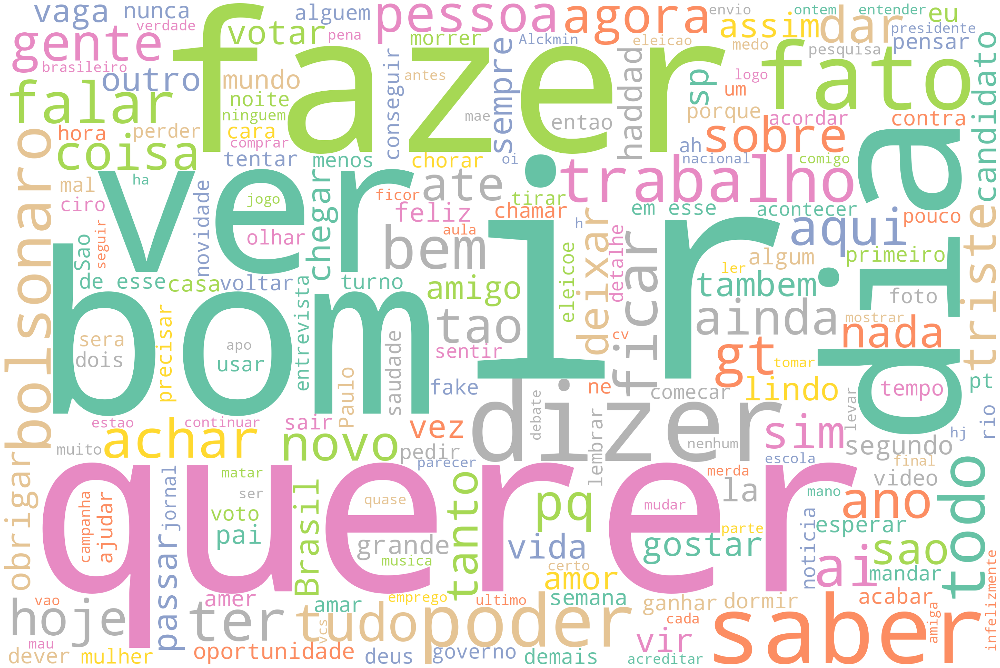

In [63]:
#Criando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='white',
                            colormap='Set2',
                            collocations=False,
                            stopwords=stopwords_pt,
                        ).generate_from_frequencies(wc_df(words_train_clean_update)) #aplicando a função wc_df para criar um dicionário de palavras
         )
plot_cloud(wordcloud)

Após corrigirmos as **stopwords** com escrita incorreta, a **wordcloud** apresentou mudanças significativas.  
- O nome do político **Bolsonaro** tornou-se muito mais expressivo.  
- Palavras como **"bom"** e **"dia"** aparecem com destaque, refletindo expressões comuns no Twitter.  
- Observa-se também uma presença considerável de **verbos** e de palavras relacionadas às **eleições**.

A seguir, vamos analisar a **nova wordcloud das palavras positivas**.


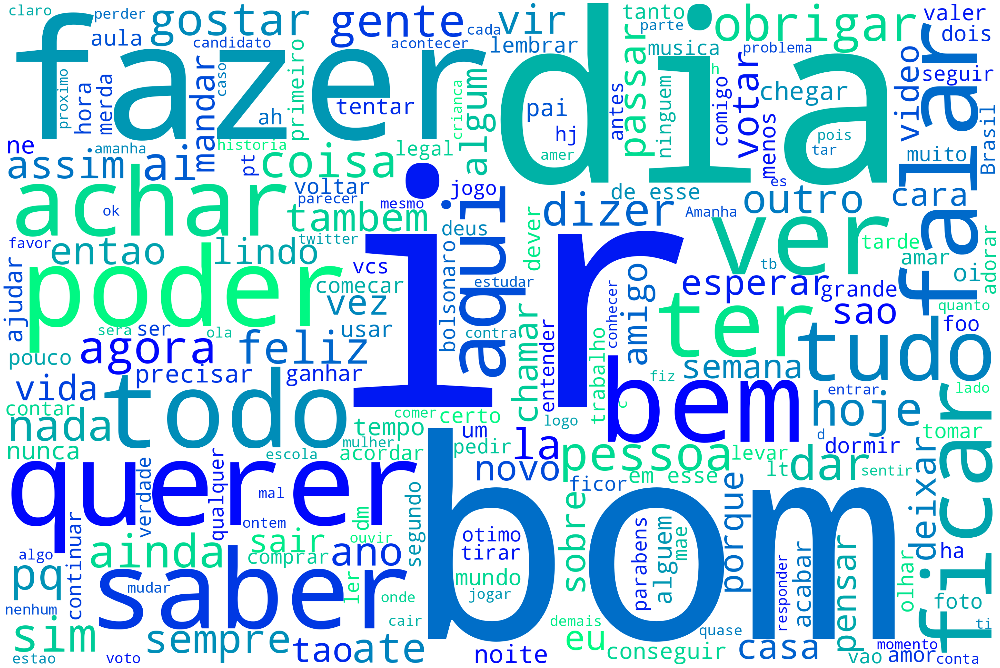

In [64]:
#Gerando um filtro para pegar opiniões positivas
filter = (words_train_clean_update['sentiment'] == 1)
#Gerando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='white',
                            colormap='winter',
                            collocations=False,
                            stopwords=stopwords_pt,
                        ).generate_from_frequencies(wc_df(words_train_clean_update,filter=True,filter_type=filter))
         )
plot_cloud(wordcloud)

Essa wordcloud evidenciou melhor as palavras de **teor positivo**, com destaque para **"bom"**, assim como outras palavras positivas como **"poder"**, **"bem"**, **"feliz"**, **"casar"**, **"gostar"**, **"amar"**.

Em seguida, realizaremos o mesmo exercício para analisar as **palavras negativas**.


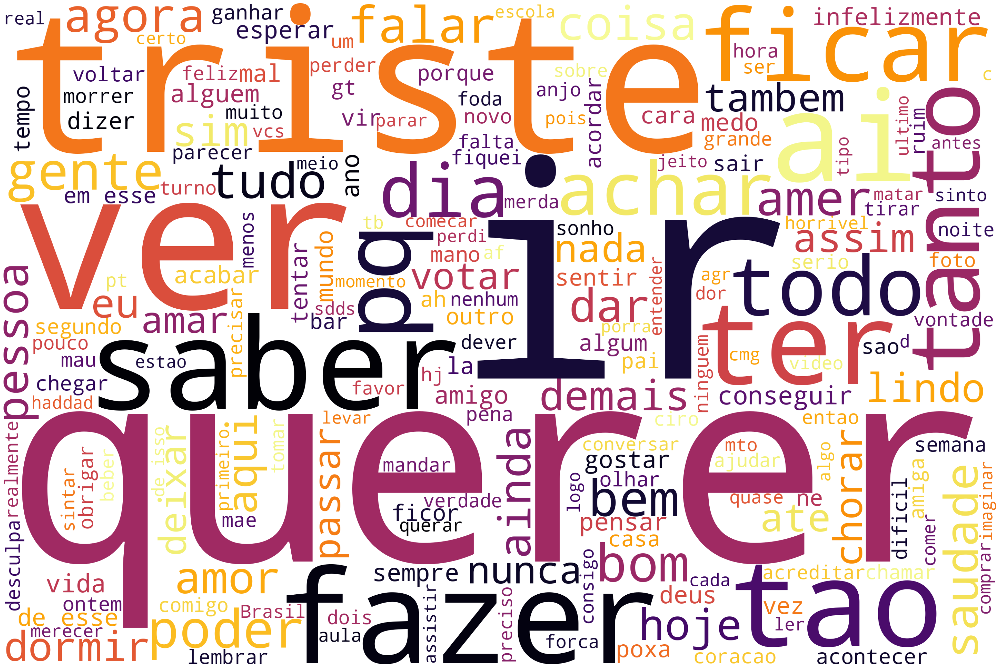

In [65]:
#Gerando um filtro para pegar opiniões negativas
filter = (words_train_clean_update['sentiment'] == 0)
#Gerando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='white',
                            colormap='inferno',
                            collocations=False,
                            stopwords=stopwords_pt,
                        ).generate_from_frequencies(wc_df(words_train_clean_update,filter=True,filter_type=filter))
         )
plot_cloud(wordcloud)


Nesta wordcloud, a palavra **"triste"** se destaca, assim como o verbo **"querer"**, que provavelmente estava associado à palavra **"não"**, removida durante o pré-processamento.  
Outras palavras de forte caráter negativo, como **"chorar"**, **"saudade"**, **"foder"**, **"mal"**, **"medo"** e **"nunca"**, aparecem muito mais evidentes.

Para concluir, vamos revisitar as **palavras neutras**.


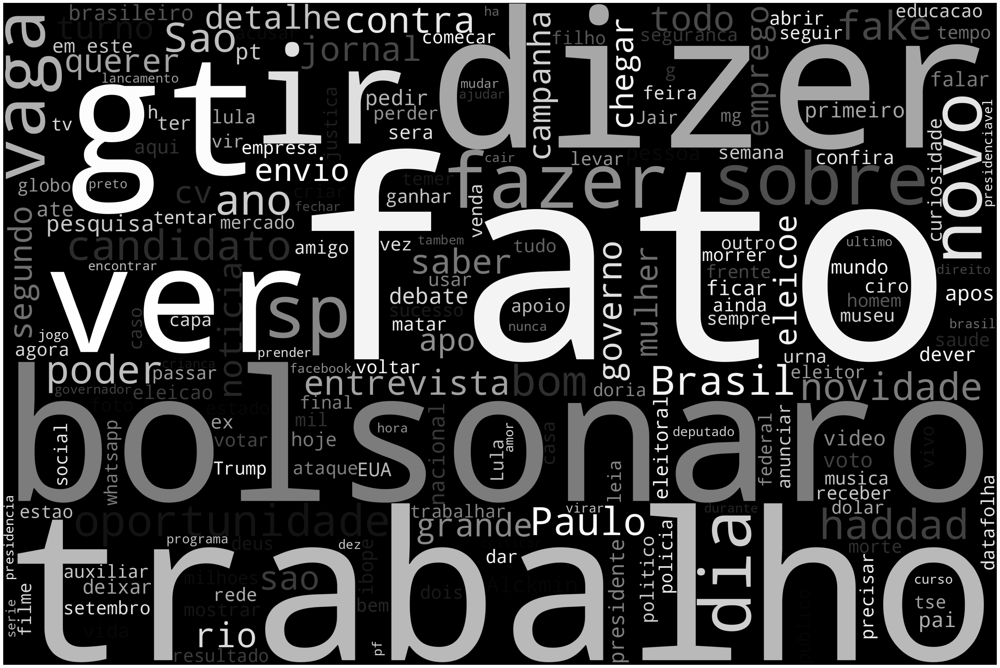

In [66]:
#Gerando um filtro para pegar opiniões neutras
filter = (words_train_clean_update['sentiment'] == 2)
#Gerando a wordcloud
wordcloud = (
                WordCloud(
                            width=3000,
                            height=2000,
                            random_state=1,
                            background_color='black',
                            colormap='Greys',
                            collocations=False,
                            stopwords=stopwords_pt,
                        ).generate_from_frequencies(wc_df(words_train_clean_update,filter=True,filter_type=filter))
         )
plot_cloud(wordcloud)

Nesta wordcloud, observamos novamente várias palavras relacionadas às **eleições**, como:  
"Bolsonaro", "fato", "candidato", "entrevistado", "poder", "Lula", "fake", "eleições", "campanha".

Em seguida, vamos **rodar nossos modelos novamente** para verificar se houve **melhora nos resultados** após o ajuste do pré-processamento.


In [67]:
table_after_preprocess_update = baseline_transform(models,words_train_clean_update['text_joined'],words_train_clean_update['sentiment'],verbose=True)


Iniciando o loop de modelos
Fit do modelo Random Forest iniciado
Fit do modelo Random Forest finalizado
Fit do modelo Gradiente Boost iniciado
Fit do modelo Gradiente Boost finalizado
Fit do modelo Regressão Logística iniciado
Fit do modelo Regressão Logística finalizado
Fit do modelo XGBoost iniciado
Fit do modelo XGBoost finalizado
Fit do modelo Catboost iniciado
Fit do modelo Catboost finalizado


In [68]:

table_after_preprocess_update

,Random Forest,Gradiente Boost,Regressão Logística,XGBoost,Catboost
recall_test,0.746842,0.614811,0.791326,0.701063,0.707211
recall_train,0.986561,0.617558,0.891974,0.716076,0.712279
precision_test,0.752523,0.697717,0.792127,0.732782,0.732049
precision_train,0.986613,0.701390,0.891914,0.748289,0.736632
f1_test,0.747629,0.615279,0.791488,0.703530,0.708244
f1_train,0.986572,0.618062,0.891882,0.718532,0.713173
accuracy_test,0.746842,0.614811,0.791326,0.701063,0.707211
accuracy_train,0.986561,0.617558,0.891974,0.716076,0.712279
roc_auc_test,0.896662,0.813451,0.921637,0.872805,0.874717
roc_auc_train,0.998307,0.816737,0.972539,0.885984,0.878456


A tentativa de melhoria do pré-processamento **não apresentou impacto significativo** nas métricas de desempenho.  
Observa-se que os modelos de **Random Forest** e **Regressão Logística** continuam apresentando **overfitting** no conjunto de treino.


In [69]:
#Repetindo o mesmo processo de criação dos datasets para treinamento e teste com os transformadores porém após o novo pre processamento

#Criando o X e o Y que usaremos nas transformações de bag of words e TF-IDF
X_up = words_train_clean_update['text_joined'].copy()
y_up = words_train_clean_update['sentiment'].copy()
#Treino para o bag of words e para o TF-IDF (passamos de treino e teste uma sentença)
X_train_up, X_test_up, y_train_up, y_test_up = train_test_split(X_up, y_up, test_size = 0.3, random_state = 42)

#Criando o X e o Y que usaremos nas transformações de word2vec e doc2vec
X_up_ = words_train_clean_update['text_clean'].copy()
y_up_ = words_train_clean_update['sentiment'].copy()
#Treino para doc2vec
X_train_up_, X_test_up_, y_train_up_, y_test_up_ = train_test_split(X_up_, y_up_, test_size = 0.3, random_state = 42)


#Fazendo as transformações em cada dataset de treino e teste cada transformação

#####Bag of words#####
cv = CountVectorizer()
X_train_cv_up = cv.fit_transform(X_train_up)
X_test_cv_up = cv.transform(X_test_up)
print("Bag of words criado")

######TF-IDF#####
tfidf = TfidfVectorizer()
X_train_tfidf_up = tfidf.fit_transform(X_train_up)
X_test_tfid_up = tfidf.transform(X_test_up)
print('TF-IDF criado')

######Word2Vec skipgram#####
w2v_s = Word2Vec(sentences=X_train_up_, vector_size=500, min_count=5, workers=-1,sg=1)
X_train_w2v_sn_skip_up = train_test_word2vec(X_train_up_,model=w2v_s)
X_test_w2v_sn_skip_up = train_test_word2vec(X_test_up_,model=w2v_s)
print('Word2Vec skipgram criado')


#####Word2Vec cbow#####
w2v_c = Word2Vec(sentences=X_train_up_, vector_size=500, min_count=5, workers=-1,sg=0)
X_train_w2v_sn_cbow_up = train_test_word2vec(X_train_up_,model=w2v_c)
X_test_w2v_sn_cbow_up = train_test_word2vec(X_test_up_,model=w2v_c)
print('Word2Vec cbow criado')

#####Doc2vec#####
train_corpus = read_corpus_doc2vec(X_train_up_)
test_corpus = read_corpus_doc2vec(X_test_up_, tokens_only=True)
d2v = doc2vec.Doc2Vec(vector_size=500, min_count=2, epochs=20)
d2v.build_vocab(train_corpus)
d2v.train(train_corpus, total_examples=d2v.corpus_count, epochs=d2v.epochs)
X_train_d2v_up = train_test_doc2vec(X_train_up_,model=d2v)
X_test_d2v_up = train_test_doc2vec(X_test_up_,model=d2v)
print('Doc2vec criado')

Bag of words criado
TF-IDF criado


Word2Vec skipgram criado


Word2Vec cbow criado
Doc2vec criado


In [73]:
#Dicionário de transformadores com suas respectivas bases de treino e testes com as transformações aplicadas
transformers_train_test_sets_up = {'bag of words':{'X_train':X_train_cv_up,
                                                'X_test':X_test_cv_up,
                                                'y_train':y_train_up,
                                                'y_test':y_test_up},

                                        'TF-IDF':{'X_train':X_train_tfidf_up,
                                                'X_test':X_test_tfid_up,
                                                'y_train':y_train_up,
                                                'y_test':y_test_up},

                            'Word2Vec skipgram':{'X_train':X_train_w2v_sn_skip_up,
                                                'X_test':X_test_w2v_sn_skip_up,
                                                'y_train':y_train_up_,
                                                'y_test':y_test_up_},

                                'Word2Vec cbow':{'X_train':X_train_w2v_sn_cbow_up,
                                                'X_test':X_test_w2v_sn_cbow_up,
                                                'y_train':y_train_up_,
                                                'y_test':y_test_up_},

                                    'Doc2vec':{'X_train':X_train_d2v_up,
                                                'X_test':X_test_d2v_up,
                                                'y_train':y_train_up_,'y_test':y_test_up_}}
table_up = try_transformers(transformers_train_test_sets_up,models)

BAG OF WORDS
Treinando bag of words
Treinamento com bag of words finalizado
Testando bag of words
Teste com bag of words finalizado

                 ###############################################
                 ################ Classification Report ###############
                 ###############################################
               
              precision    recall  f1-score   support

           0       0.72      0.75      0.73      9559
           1       0.70      0.69      0.70      9555
           2       0.94      0.93      0.94      9386

    accuracy                           0.79     28500
   macro avg       0.79      0.79      0.79     28500
weighted avg       0.79      0.79      0.79     28500

************************************************** 

TF-IDF
Treinando TF-IDF
Treinamento com TF-IDF finalizado
Testando TF-IDF
Teste com TF-IDF finalizado

                 ###############################################
                 ################ Classificatio

In [75]:
table_up

,bag of words,TF-IDF,Word2Vec skipgram,Word2Vec cbow,Doc2vec
recall_test,0.786035,0.788842,0.656912,0.656912,0.631965
recall_train,0.786932,0.790887,0.658331,0.658331,0.619970
precision_test,0.787236,0.788126,0.655964,0.655964,0.630756
precision_train,0.788102,0.790230,0.657299,0.657299,0.618296
f1_test,0.786485,0.788205,0.656226,0.656226,0.631185
f1_train,0.787260,0.790253,0.657641,0.657641,0.618908
accuracy_test,0.786035,0.788842,0.656912,0.656912,0.631965
accuracy_train,0.786932,0.790887,0.658331,0.658331,0.619970
roc_auc_test,0.918337,0.921880,0.834087,0.834087,0.810629
roc_auc_train,0.918744,0.922642,0.835090,0.835090,0.801365


Analisando o **classification report**, percebemos que a transformação que mais traz resultados é o **TF-IDF**, pois apresenta a **maior precision para a classe 0**.  
Como a classe 0 corresponde a **sentimentos negativos**, que naturalmente fornecem insights valiosos para empresas sobre possíveis pontos de melhoria e fricções com clientes, optamos por focar na transformação com melhor precision para essa classe.

Observamos também que o pré-processamento aprimorado **não trouxe melhorias** nas métricas dos modelos com as diferentes transformações.  
Portanto, retornaremos ao **pré-processamento original** e realizaremos o **tuning do modelo de Regressão Logística** utilizando a transformação **TF-IDF**.


<H2>Tunando os modelos</H2>

In [74]:
transformers_train_test_sets['TF-IDF']['X_train']

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 525828 stored elements and shape (66500, 37930)>

In [76]:
transformers_train_test_sets['TF-IDF']['y_train']

,sentiment
56308,1
60387,1
4872,0
28954,0
56766,1
...,...
6265,2
54886,0
76820,0
860,0


In [92]:
#definindo uma função objetivo

def objective(trial):
    #Definindo o dicionário com o grid de parâmetros que testaremos
    params = dict(
        penalty = trial.suggest_categorical('penalty',['none','l1','l2','elasticnet']),
        tol = trial.suggest_float('tol',1e-4,1e-2,log=True),
        C = trial.suggest_float('C',1,3.5),
        max_iter = trial.suggest_int('max_iter',100,500),
        warm_start = trial.suggest_categorical('warm_start',[True,False]),
        l1_ratio = trial.suggest_float('l1_ratio',0,1),

    )
    if params['penalty'] == 'none':
        params['penalty'] = None  # sklearn exige None, não 'none'
    if params['penalty'] != 'elasticnet':
        params['l1_ratio'] = None  # só usado quando penalty='elasticnet'

    #Instanciado o modelo
    model = LogisticRegression(**params,random_state=43,n_jobs=-1,solver='saga',multi_class='multinomial')
    #O que queremos maximizar é a métrica precision e para isso faremos um cross validation de 5 folds, como teremos 5 precision de retorno (para cada fold), pegaremos a média deles

    #Aqui está ocorrendo target leak da base de validação para a base de treino e isso precisará ser corrigido em revisões futuras desse projeto
    return cross_validate(model,
                        transformers_train_test_sets['TF-IDF']['X_train'], #dataset de treino com a transformação aplicada
                        transformers_train_test_sets['TF-IDF']['y_train'], #dataset de treino com a transformação aplicada
                        scoring=['precision_weighted'],
                        cv = 5,
                        n_jobs=-1)['test_precision_weighted'].mean()

study_lg = optuna.create_study(direction="maximize",study_name ='Logistic Regression Study')
study_lg.optimize(objective, n_trials=10)
reglog_params = study_lg.best_params

[I 2025-10-20 18:00:53,257] A new study created in memory with name: Logistic Regression Study
[I 2025-10-20 18:00:57,442] Trial 0 finished with value: 0.7971118595067026 and parameters: {'penalty': 'l2', 'tol': 0.0007712787486510139, 'C': 1.103490519427687, 'max_iter': 267, 'warm_start': True, 'l1_ratio': 0.09596286333208826}. Best is trial 0 with value: 0.7971118595067026.
[I 2025-10-20 18:05:23,047] Trial 1 finished with value: 0.793844413001801 and parameters: {'penalty': 'elasticnet', 'tol': 0.00036914089867189597, 'C': 1.406006435654901, 'max_iter': 227, 'warm_start': False, 'l1_ratio': 0.6449801481342732}. Best is trial 0 with value: 0.7971118595067026.
[I 2025-10-20 18:05:27,680] Trial 2 finished with value: 0.7722957088932316 and parameters: {'penalty': 'none', 'tol': 0.0071328852004970125, 'C': 1.4757930664128052, 'max_iter': 486, 'warm_start': True, 'l1_ratio': 0.8834892138300414}. Best is trial 0 with value: 0.7971118595067026.
[I 2025-10-20 18:06:37,842] Trial 3 finished w

In [93]:
reglog_params


{'penalty': 'l2',
 'tol': 0.0008653860591755555,
 'C': 1.3909564185558523,
 'max_iter': 269,
 'warm_start': True,
 'l1_ratio': 0.6480759569677405}

In [94]:

plot_optimization_history(study_lg)

In [95]:
plot_param_importances(study_lg)

O hiperparâmetro de maior importância foi a penalidade, contribuindo 67% de importância. Vamos repetir a otimização agora tendo oportunidade de melhorar

In [98]:
reglog_paramns_final = {'penalty': 'l2',
 'tol': 0.0008653860591755555,
 'C': 1.3909564185558523,
 'max_iter': 269,
 'warm_start': True,
 'l1_ratio': 0.6480759569677405}

model = LogisticRegression(**reglog_paramns_final,random_state=43,n_jobs=-1,solver='saga',multi_class='multinomial')
model.fit(transformers_train_test_sets['TF-IDF']['X_train'],transformers_train_test_sets['TF-IDF']['y_train'])
y_pred = model.predict(transformers_train_test_sets['TF-IDF']['X_test'])
y_pred_proba = model.predict_proba(transformers_train_test_sets['TF-IDF']['X_test'])

print(classification_report(transformers_train_test_sets['TF-IDF']['y_test'],y_pred))

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1196: UserWarning:

l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



              precision    recall  f1-score   support

           0       0.75      0.72      0.74      9559
           1       0.71      0.72      0.71      9555
           2       0.93      0.94      0.93      9386

    accuracy                           0.79     28500
   macro avg       0.79      0.80      0.80     28500
weighted avg       0.79      0.79      0.79     28500



Atingimos uma precision final de 75% para sentimentos negativos, 71% para sentimentos positivos e 93% para sentimentos neutros.

Para gerar o arquivo de predição em nossa base de produção/submissão treinaremos o modelo com toda a base de treino e geraremos o arquivo de predições

In [101]:
tfid= TfidfVectorizer()
X_train_ful = tfid.fit_transform(words_train_clean['text_joined']) #treinamento com toda a base
X_test_full = tfid.transform(words_sub_clean['text_joined']) #transformação na base de produção/subsmissão

#Fitando e gerando as predições
model = LogisticRegression(**reglog_paramns_final,random_state=43,n_jobs=-1,solver='saga',multi_class='multinomial')
model.fit(X_train_ful,words_train_clean['sentiment'])
predictions = model.predict(X_test_full)

#Gerando o arquivo cvs com as predições no formato especificado
pd.DataFrame(index=dados_teste['id'],data={'sentiment_predict':predictions}).to_csv('predictions.csv')

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1196: UserWarning:

l1_ratio parameter is only used when penalty is 'elasticnet'. Got (penalty=l2)

/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning:

'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.



### Conclusão

Nosso modelo apresentou bom desempenho na **classificação de sentimentos neutros** e desempenho **relativamente bom para sentimentos negativos**. Quanto aos **sentimentos positivos**, o modelo ficou ligeiramente acima da média.

Considerando a aplicação prática, modelos como este poderiam ser utilizados para **classificar tweets** e, por exemplo, ajudar a **evitar churn de usuários/clientes**. Nosso modelo seria eficiente em cerca de **79% dos casos**, o que já é relevante diante do potencial de redução de churn.  
Além disso, para **sentimentos neutros**, o modelo poderia servir como um **termômetro das comunicações da empresa**, medindo a reação dos clientes a mensagens ou campanhas específicas.

Como desenvolvimentos futuros, seria possível:  
- Implementar um **modelo de stacking**, criando especialistas para cada tipo de sentimento.  
- Testar **redes neurais profundas**, visando aumentar a qualidade das métricas.

#### Ideias para revisão do projeto
- Ajustar o **pré-processamento**, evitando remover certas stopwords e caracteres como `#`.  
- Analisar os dados de forma mais detalhada, procurando **duplicatas em cada coluna**.
